
===================================================================================================

==================================================================================================

- author : Sylvie
- date   : March 7th th 2018
- update : March 13th 2018 
- Version. : 1.0

# Initialisation of the notebook

In [31]:
from IPython.core.display import HTML
def css_styling():
    styles = open("../../styles/custom.css", "r").read()
    return HTML(styles)
css_styling()

In [32]:
theNotebook="FindCentralStarPosition"

In [33]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
FindCentralStarPosition
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_31may17/CheckTargetPosition


In [34]:
from astropy.modeling import models, fitting

In [35]:
import pandas as pd

In [36]:
plt.rcParams.update({'figure.max_open_warning': 0})

## Input directory

- specify which are the input images

In [37]:
#inputdir="/sps/lsst/data/AtmosphericCalibration/CTIODataJune2017_reducedRed/data_30may17"
#MIN_IMGNUMBER=58
#MAX_IMGNUMBER=190
#date="20170530"
#object_name='HD111980'
#tag = "reduc"
#SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
#SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
#NBIMGPERROW=2

In [38]:
inputdir="/Users/dagoret/DATA/CTIODataJune2017_reducedRed/data_31may17"
MIN_IMGNUMBER=74
MAX_IMGNUMBER=108
date="20170531"
object_name='HD111980'
tag = "reduc"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

## Output directory

- specify where are stored the cut images as well as the plot produced

In [39]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./Centr_fitsimages"
ensure_dir(outputdir)

## End of mandatory initialisation

-------------------------------------------------------
# Now  skip to the section to be re-run
-------------------------------------------------------


- Section 1: Find the central star and cut the image around the the dispersed spectrum
- Section 2 : find the dispersion axis angle of rotation wrt X-axis and apply the rotation
- Section 3 : Check with 1D spectrum

# Section 1 : Find the central star and cut the image around the the dispersed spectrum

## Read of the image spectra

In [40]:
dirlist_all = [inputdir] # only one directory to process
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)
print 'Number of images:',len(all_images)

Number of images: 35


## Sort the index according the disperser type



### tabulated disperser-filters

- in common_notebook

In [41]:
print Filt_names

['dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron200', 'Unknown']


### filter-disperser in our data

- check the filter names are inside Filt_names

In [42]:
print all_filt

['RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg']


In [43]:
print all_filt1

['RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715', 'RG715']


In [44]:
print all_filt2

['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg', 'Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']


###  Do the disperser sorting



In [45]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

### Check the sorting result

In [46]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  [ 0  5 10 15 20 25 30]
dia Thor300  	 : filt1_idx ::  [ 1  6 11 16 21 26 31]
dia HoloPhP  	 : filt2_idx ::  [ 2  7 12 17 22 27 32]
dia HoloPhAg  	 : filt3_idx ::  [ 3  8 13 18 23 28 33]
dia HoloAmAg  	 : filt4_idx ::  [ 4  9 14 19 24 29 34]
dia Ron200  	 : filt5_idx ::  []
Unknown  	 : filt6_idx ::  []


## Example for one raw image


- the idea is to check where is the center of the main star
- size 2k x 2 K

In [47]:
# select the index
sel_index=0

Text(1000,1700,'RG715 Ron400')

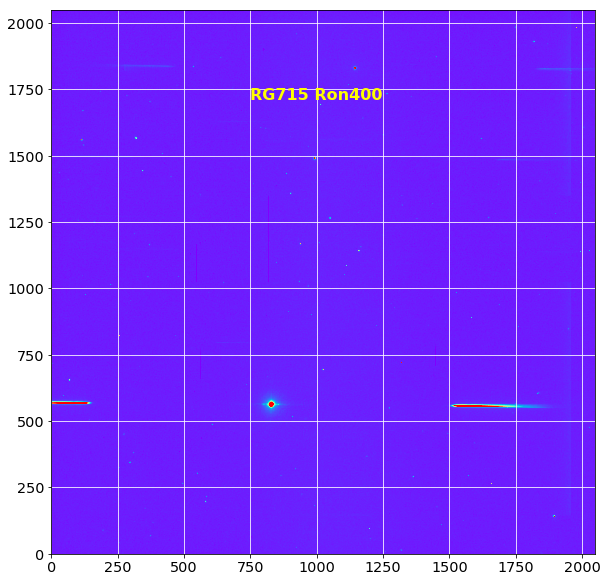

In [48]:
plt.figure(figsize=(10,10))
plt.imshow(all_images[sel_index],origin='lower',cmap='rainbow',vmin=0, vmax=2000)
plt.grid(color='white', ls='solid')
plt.text(1000.,1700,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

### Try to fit a 2D gaussian

- Fit a 2D gaussian on intensity of central star


we have to play with the parameter below to find a common region to find the central star

### Write initial guess

In [49]:
X_c_hand=825
Y_c_hand=570
Xc_min=X_c_hand-50
Xc_max=X_c_hand+50
Yc_min=Y_c_hand-50
Yc_max=Y_c_hand+50

In [50]:
# first rough estimate of the maximum
x0,y0=guess_init_fit(all_images[sel_index],Xc_min,Xc_max,Yc_min,Yc_max)

In [51]:
dw=200  # width

In [52]:
print "x0,y0=",x0,y0

x0,y0= 828 563


In [53]:
# cut the subimage
cropped_image=np.copy(all_images[sel_index][y0-dw:y0+dw,x0-dw:x0+dw])

In [54]:
NY=cropped_image.shape[0]
NX=cropped_image.shape[1]

In [55]:
# build a mesh grid of x-y
y, x = np.mgrid[:NY,:NX]

In [56]:
z=cropped_image[y,x]

### Show the pre-selected subimage

Text(100,100,'RG715 Ron400')

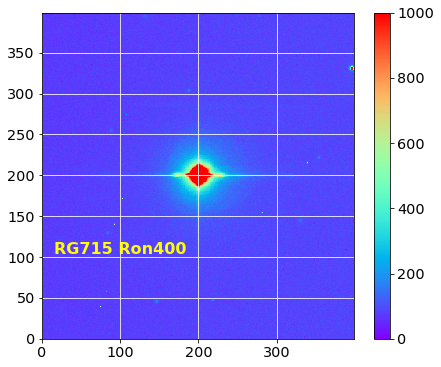

In [57]:
# plot x,y,z
plt.figure(figsize=(7,6))
plt.pcolormesh(x, y, z,cmap='rainbow',vmin=0, vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.text(100.,100,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

In [58]:
x_mean=NX/2
y_mean=NY/2
z_max=z[y_mean,x_mean]
print x_mean,y_mean,z_max

200 200 61323.4956937


### Make the 2D fit

In [59]:
p_init = models.Gaussian2D(amplitude=z_max,x_mean=x_mean,y_mean=y_mean)
fit_p = fitting.LevMarLSQFitter()

In [60]:
import warnings
p = fit_p(p_init, x, y, z)

In [61]:
print p.x_mean
print p.y_mean
print p.amplitude

Parameter('x_mean', value=200.270285287)
Parameter('y_mean', value=200.613981723)
Parameter('amplitude', value=79710.3067529)


In [62]:
new_x0=p.x_mean
new_y0=p.y_mean

### Show result of 2D gaussian fit

Text(0.5,1,'Residual')

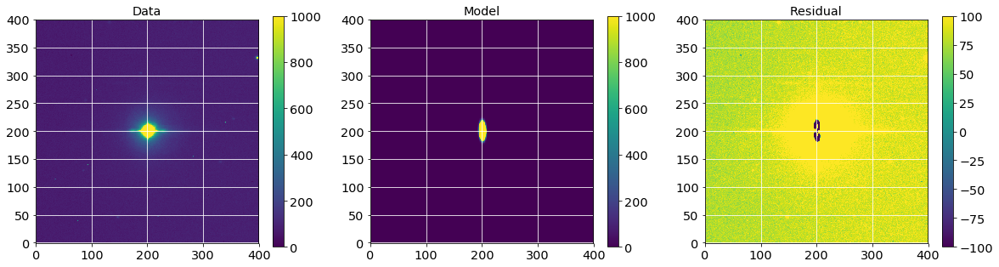

In [63]:
plt.figure(figsize=(20, 5))
#subplot 1
plt.subplot(1, 3, 1)
plt.imshow(z, origin='lower', interpolation='nearest', vmin=0, vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Data")
#subplot 2
plt.subplot(1, 3, 2)
plt.imshow(p(x, y), origin='lower', interpolation='nearest', vmin=0,vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Model")
#subplot 3
plt.subplot(1, 3, 3)
plt.imshow(z - p(x, y), origin='lower', interpolation='nearest', vmin=-100,vmax=100)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Residual")

### Check the result of the fit

- the center of the star is where it is expected (black point)

Text(100,100,'RG715 Ron400')

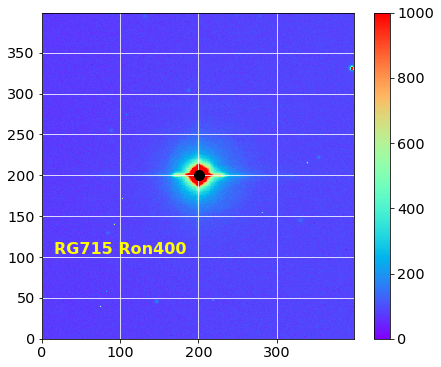

In [64]:
plt.figure(figsize=(7,6))
plt.pcolormesh(x, y, z,cmap='rainbow',vmin=0, vmax=1000)
plt.plot([new_x0],[new_y0],'ko',markersize=10)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.text(100.,100,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

## Show the images at Input

- So now work on the series of the images

- First look at them
- notice there is a downsampling factor of 10

Processing image 0...
Processing image 1...
Processing image 2...
Processing image 3...
Processing image 4...
Processing image 5...
Processing image 6...
Processing image 7...
Processing image 8...
Processing image 9...
Processing image 10...
Processing image 11...
Processing image 12...
Processing image 13...
Processing image 14...
Processing image 15...
Processing image 16...
Processing image 17...
Processing image 18...
Processing image 19...
Processing image 20...
Processing image 21...
Processing image 22...
Processing image 23...
Processing image 24...
Processing image 25...
Processing image 26...
Processing image 27...
Processing image 28...
Processing image 29...
Processing image 30...
Processing image 31...
Processing image 32...
Processing image 33...
Processing image 34...


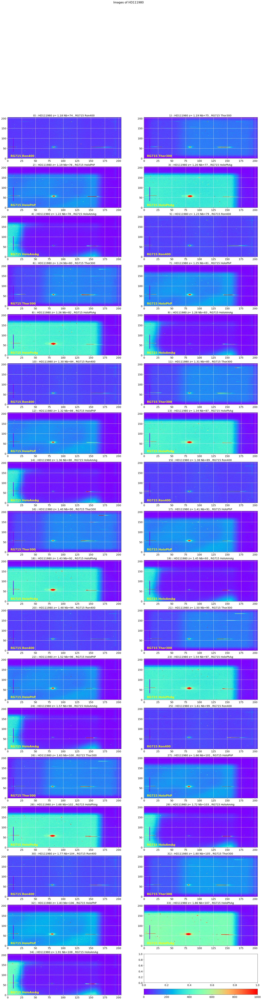

In [65]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,downsampling=10,verbose=True)
figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

## Show the histograms of input images

- just check the reduction and deflattage is OK

In [66]:
#ShowHistograms(all_images,all_titles,all_filt,object_name,
#               NBIMGPERROW=2,bins=100,range=(-50,10000),downsampling=10,verbose=True)

##  Guess central position of the central star in original image

- defines two utility functions


### Compute the position of central star

** Please the the area for the central star here **

- This is very important to predefine here the region where you expect the order 0 bright central star.
- Check below if the pre-selection allow to target the right bright star

In [67]:
# guess the region where the maximum is
#Delta_x0=[750,1000]
#Delta_y0=[500,750]
#dwc=125

#Delta_x0=[500,1100]
#Delta_y0=[500,1100]
#dwc=200

Delta_x0=[Xc_min,Xc_max]
Delta_y0=[Yc_min,Yc_max]
dwc=200


x_guess,y_guess=guess_central_position(all_images,Delta_x0,Delta_y0,dwc,filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx)

0 : (x_guess,y_guess)= 828.270285287 563.613981723
1 : (x_guess,y_guess)= 827.431878483 565.286689961
2 : (x_guess,y_guess)= 826.412062769 563.612937868
3 : (x_guess,y_guess)= 825.415712713 562.828560407
4 : (x_guess,y_guess)= 822.322790597 564.244413782
5 : (x_guess,y_guess)= 821.106914234 564.8366384
6 : (x_guess,y_guess)= 820.893097561 566.305374227
7 : (x_guess,y_guess)= 820.27360454 564.767557535
8 : (x_guess,y_guess)= 819.942188841 563.550806812
9 : (x_guess,y_guess)= 817.016722526 566.006228756
10 : (x_guess,y_guess)= 816.931815031 566.363034625
11 : (x_guess,y_guess)= 816.003273999 567.895846568
12 : (x_guess,y_guess)= 814.635825079 566.083141004
13 : (x_guess,y_guess)= 815.249336215 565.641209998
14 : (x_guess,y_guess)= 813.835809676 567.800092356
15 : (x_guess,y_guess)= 813.133364406 568.322957234
16 : (x_guess,y_guess)= 813.781003976 570.266019052
17 : (x_guess,y_guess)= 811.467330339 568.750614499
18 : (x_guess,y_guess)= 811.875653353 568.151386292
19 : (x_guess,y_guess)= 8

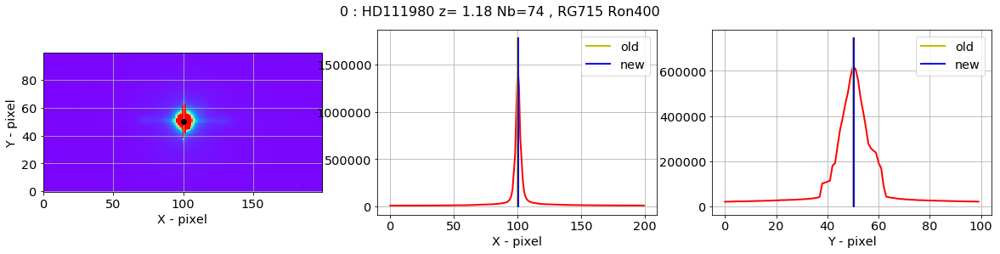

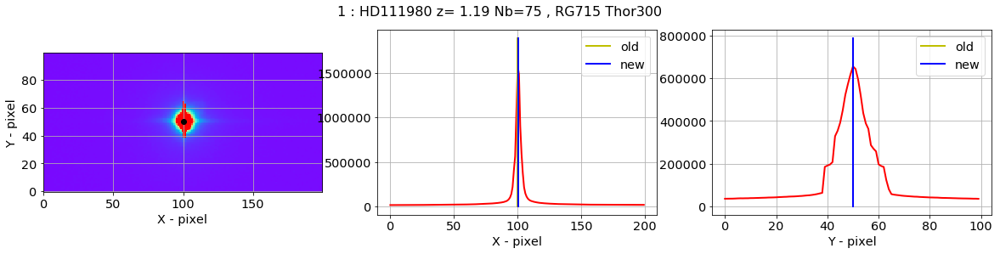

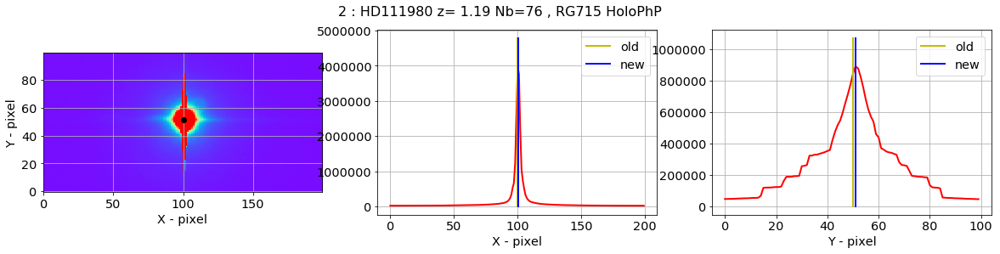

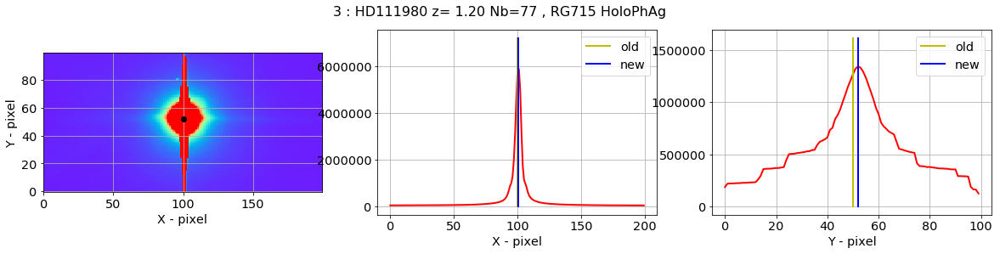

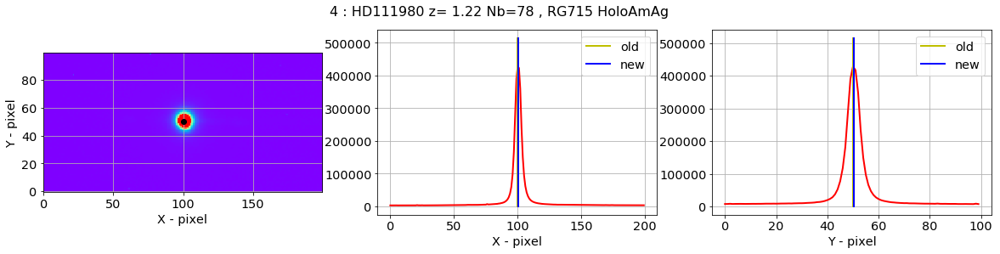

...

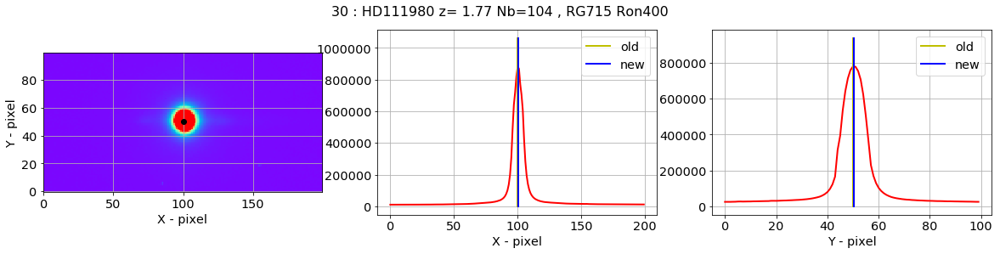

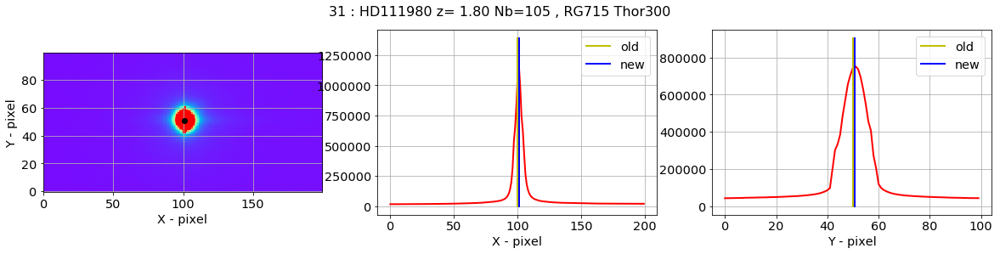

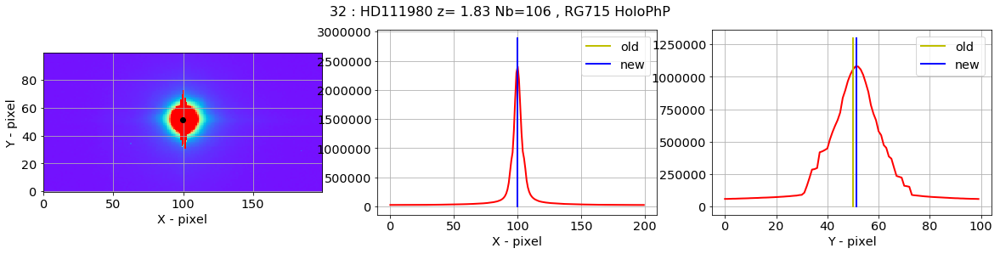

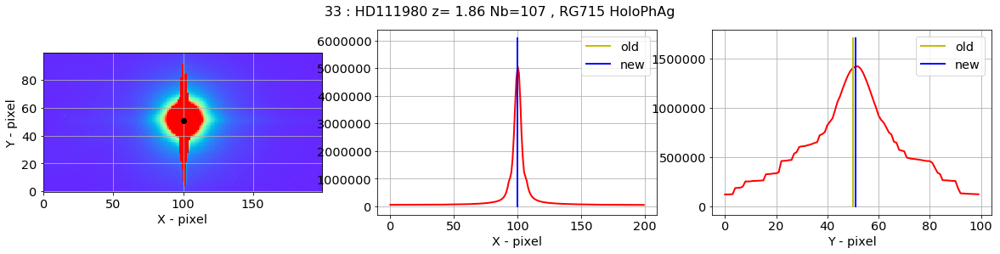

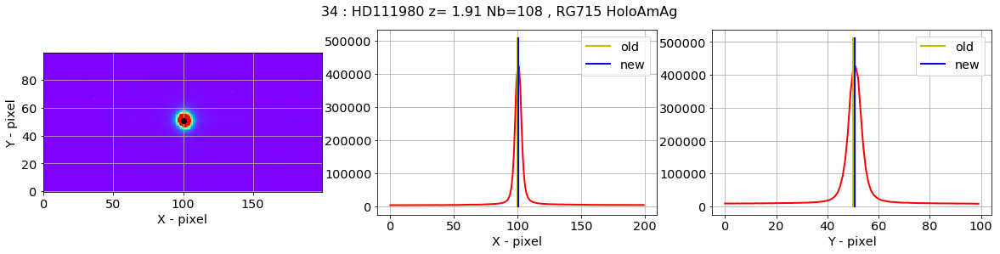

In [68]:
new_x_guess,new_y_guess=check_central_star(all_images,x_guess,y_guess,all_titles,all_filt,Dx=100,Dy=50)

### Check corrections of the center

In [69]:
dx_guess=new_x_guess-x_guess
dy_guess=new_y_guess-y_guess

Text(0.5,0,'dy - pixel')

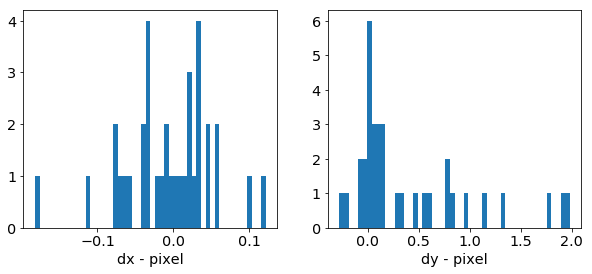

In [70]:
f, (ax1, ax2) = plt.subplots(1,2, figsize=(10,4))
ax1.hist(dx_guess,bins=50);
ax1.set_xlabel("dx - pixel")
ax2.hist(dy_guess,bins=50);
ax2.set_xlabel("dy - pixel")

In [71]:
x_guess=new_x_guess
y_guess=new_y_guess

## Save x_guess, y_guess in a file

In [72]:
ar = {'x_guess' : x_guess, 'y_guess' : y_guess}
df = pd.DataFrame(ar)

In [73]:
df.head()

,x_guess,y_guess
0,828.229602,563.336487
1,827.376519,565.081796
2,826.379751,564.157762
3,825.513989,563.989613
4,822.342548,564.266414


In [74]:
df.tail()

,x_guess,y_guess
30,800.337523,573.396544
31,799.797534,574.828459
32,797.910095,574.287284
33,796.089796,573.988937
34,794.445560,574.764871


In [75]:
df.describe()

,x_guess,y_guess
count,35.000000,35.000000
mean,812.207266,569.164274
std,8.959909,3.502375
min,794.445560,563.336487
25%,806.376619,566.195726
50%,811.922607,568.937498
75%,818.483615,571.981202
max,828.229602,574.828459


In [76]:
df.to_csv('x_y_guess.csv')

In [77]:
df

,x_guess,y_guess
0,828.229602,563.336487
1,827.376519,565.081796
2,826.379751,564.157762
3,825.513989,563.989613
4,822.342548,564.266414
5,821.120189,564.936110
6,820.927638,566.354544
7,820.208725,565.554640
8,819.906320,565.531368
9,817.060909,566.036907


In [78]:
df.to_csv('x_y_guess.csv')

In [79]:
writer = pd.ExcelWriter('x_y_guess.xlsx')
sheet_name=object_name+'_'+date
df.to_excel(writer,sheet_name)
writer.save()

## Finally cut image

- before rotation

- cut the image around the spectra
- the width in Y is DeltaY=100 pixel above and down

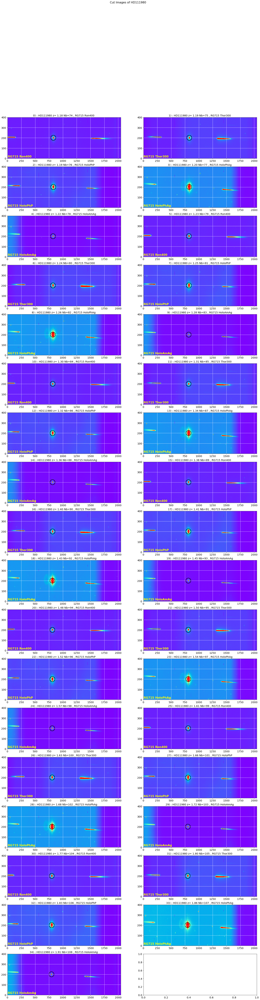

In [80]:
DeltaY=[200]*len(all_images) # put to 200 because background goes far
DeltaX=[2000]*len(all_images)  # must be very large to have correct x positions

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=2000,target_pos=np.array([x_guess,y_guess]).T)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

## Save cut images
------------------------

- save the series of cut images called **images_raw** in a file


In [81]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)